In [1]:
from tqdm import tqdm
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from matplotlib import pyplot as plt

sc.set_figure_params(frameon=False, dpi=80)

/Users/michaela.mueller/miniforge3/envs/scanpy/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
from scatlastb_utils.io import read_anndata
from scatlastb_utils.pipeline.misc import dask_compute

/Users/michaela.mueller/miniforge3/envs/scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# optional, if you want to use rapids_singlecell for GPU acceleration
try:
    import rapids_singlecell as rsc
except:
    rsc = sc

# Read data

In [4]:
file_path = 'data/pipeline/majority_voting/dataset~integration_benchmark_beta/file_id~collect:integration_benchmark_beta.zarr'

In [5]:
ls {file_path}/obsm/

X_emb--marker_genes:label_transfer:clustering:metrics:harmony@
X_emb--marker_genes:label_transfer:clustering:metrics:scvi@
X_emb--marker_genes:label_transfer:clustering:metrics:unintegrated@
X_umap--marker_genes:label_transfer:clustering:metrics:harmony@
X_umap--marker_genes:label_transfer:clustering:metrics:scvi@
X_umap--marker_genes:label_transfer:clustering:metrics:unintegrated@


In [6]:
adata = read_anndata(
    file_path,
    obs='obs',
    obsm='obsm',
    var='var',
)
adata

dask: False, backed: False
Read slot "obs", store as "obs"...
Read slot "obsm", store as "obsm"...


Read obsm slots as_dask=False: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 78.48it/s]

Read slot "var", store as "var"...
shape: (35465, 31202)


AnnData object with n_obs × n_vars = 35465 × 31202
    obs: 'batch_integration', 'dataset', 'design', 'cell_cycle_phase', 'ins_high', 'gcg_high', 'sst_high', 'ppy_high', 'cell_filtering', 'strain', 'age', 'cell_type_originalDataset_unified', 'cell_type_originalDataset', 'cell_type_reannotatedIntegrated', 'n_genes', 'mt_frac', 'doublet_score', 'log10_n_counts', 'age_approxDays', 'dataset__design__sample', 'cell_subtype_immune_reannotatedIntegrated', 'cell_subtype_endothelial_reannotatedIntegrated', 'emptyDrops_LogProb_scaled', 'cell_subtype_beta_coarse_reannotatedIntegrated', 'cell_subtype_beta_fine_reannotatedIntegrated', 'GP_1', 'GP_2', 'GP_3', 'GP_4', 'GP_5', 'GP_6', 'GP_7', 'GP_8', 'GP_9', 'GP_10', 'GP_11', 'GP_12', 'GP_13', 'GP_14', 'GP_15', 'GP_16', 'GP_17', 'GP_18', 'GP_19', 'GP_20', 'GP_21', 'GP_22', 'GP_23', 'GP_24', 'GP_25', 'GP_26', 'GP_27', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'diabetes_model', 'chemical_stress', 'GEO_

## Data exploration

In [7]:
adata.obs['assay'].value_counts()

10x 3' v2    21148
10x 3' v3    14317
Name: assay, dtype: int64

In [8]:
adata.obs[
    ['dataset', 'disease', 'sex']
].value_counts(sort=False, dropna=False)

dataset  disease  sex   
4m       normal   male      13738
P16      normal   female     4504
                  male       2906
aged     normal   female     9017
                  male       5300
dtype: int64

### Preprocessing
* log total counts normalisation (scanpy function, target sum 1e4) + log-transformation
* Feature selection with `sc.pp.highly_variable_genes`

```yaml
preprocessing:
  raw_counts: X
  normalize:
    target_sum: 10_000
  highly_variable_genes:
    n_top_genes: 2000
    batch_key: dataset
    dask: false
  assemble:
    - normalize
    - highly_variable_genes
```


In [9]:
adata.var[adata.var.columns[adata.var.dtypes == bool]].sum()

feature_is_filtered          711
highly_variable             2000
present_Fltp_2y            30625
present_Fltp_P16           30625
present_Fltp_adult         30625
present_NOD                31068
present_NOD_elimination    31068
present_STZ                31068
present_VSG                30625
present_embryo             31068
present_spikein_drug       31068
integration_features        2000
dtype: int64

In [10]:
adata.obs['dataset'].value_counts()

aged    14317
4m      13738
P16      7410
Name: dataset, dtype: int64

### Integration setup

#### Batch variable

In [11]:
adata.obs['batch_integration'].value_counts()

Fltp_2y_MUC13974     6445
Fltp_2y_MUC13976     5459
Fltp_adult_mouse4    4325
Fltp_adult_mouse2    4252
Fltp_P16_145_mGFP    3246
Fltp_adult_mouse1    3245
Fltp_P16_146_mRFP    2628
Fltp_2y_MUC13975     2413
Fltp_adult_mouse3    1916
Fltp_P16_147_mTmG    1536
Name: batch_integration, dtype: int64

#### Methods and hyperparameters
Find the full method configuration in `configs/defaults.yaml`

```yaml
methods:
  unintegrated:
  harmony_pytorch:
    n_comps: 50
    scale: true
  scvi:
    n_latent: 30
    encode_covariates: True
    deeply_inject_covariates: False
    use_layer_norm: both
    use_batch_norm: none
    gene_likelihood: nb
    max_epochs: 20
    early_stopping: true
```

## Visualise Integrations

In [12]:
colors = [
    'disease',
    'dataset',
    'assay',
    # 'cell_type_reannotatedIntegrated',
    # 'cell_type_originalDataset_unified',
    'cell_subtype_beta_fine_reannotatedIntegrated',
    'majority_consensus',
    'majority_consensus_agreement',
    'majority_consensus_low_agreement',
]

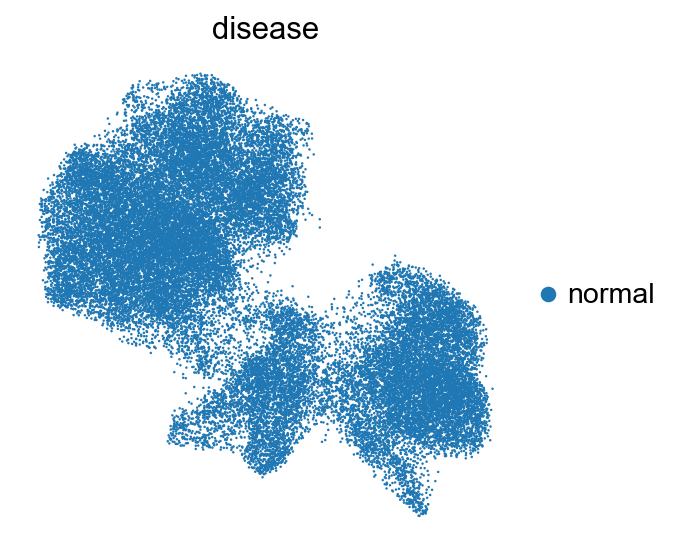

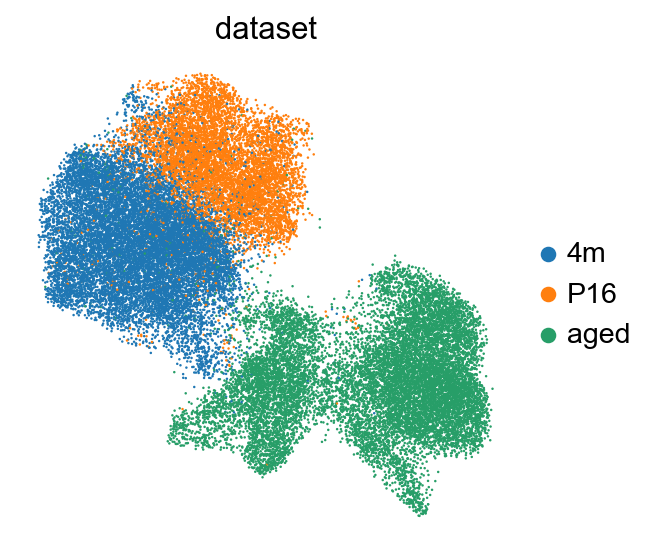

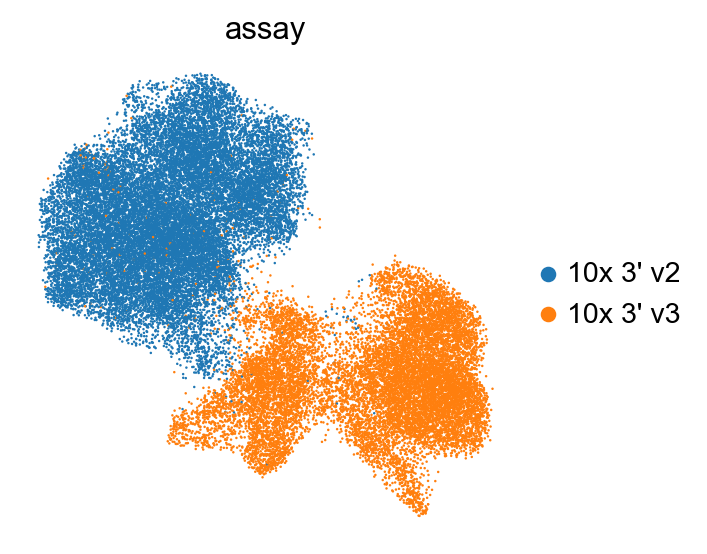

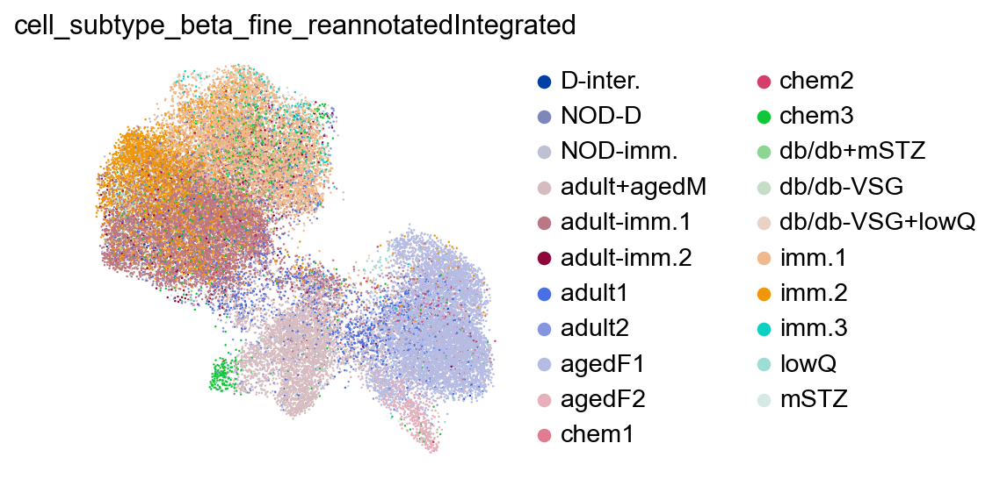

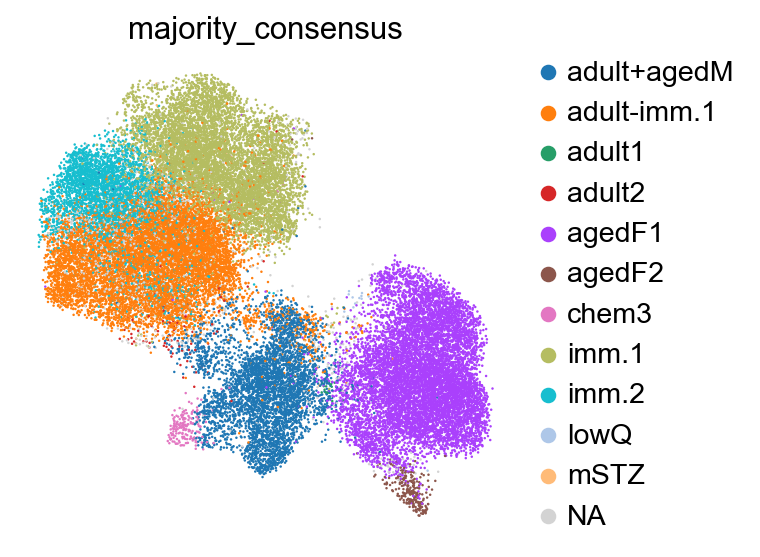

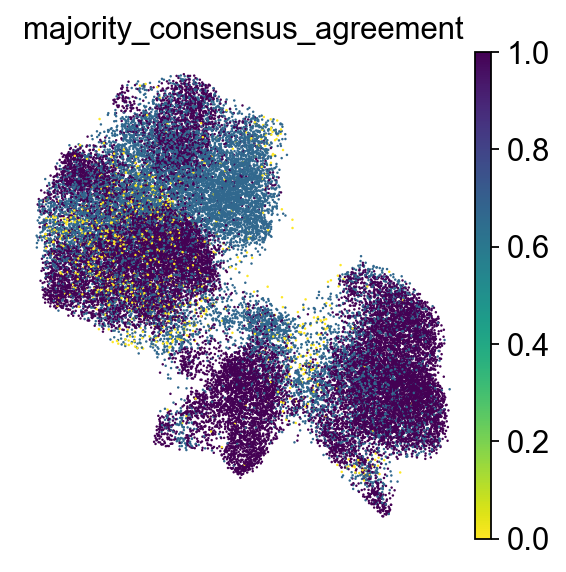

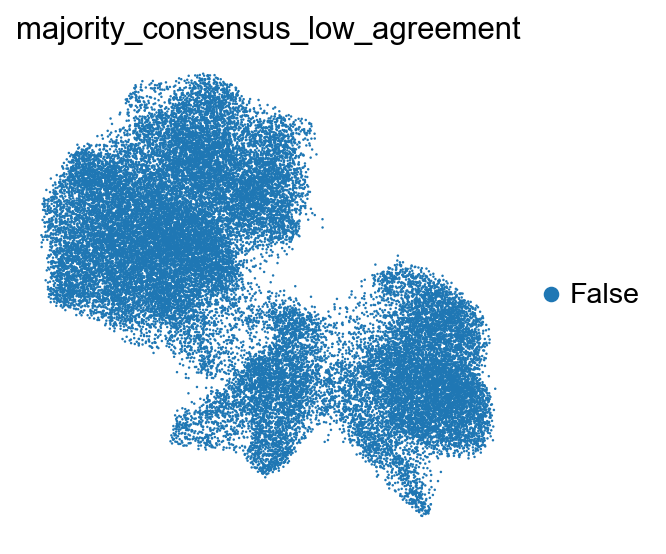

In [13]:
integration = 'scvi'

for col in colors:
    sc.pl.embedding(
        adata,
        f'X_umap--marker_genes:label_transfer:clustering:metrics:{integration}',
        color=col,
        sort_order=False,
        cmap='viridis_r',
        size=5,
    )

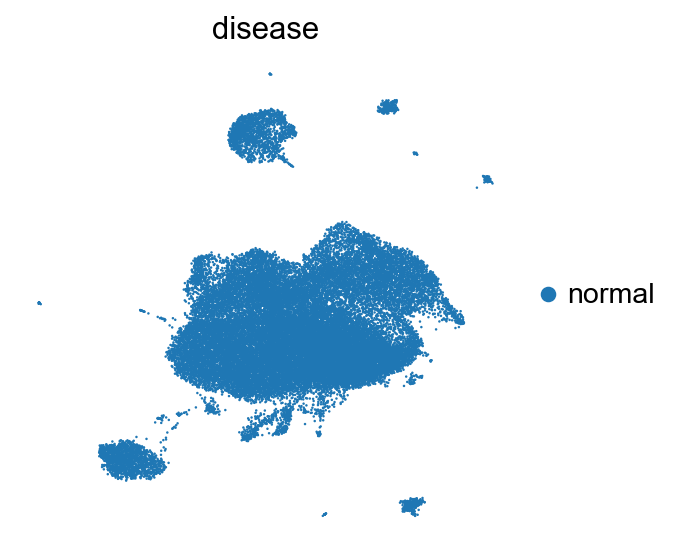

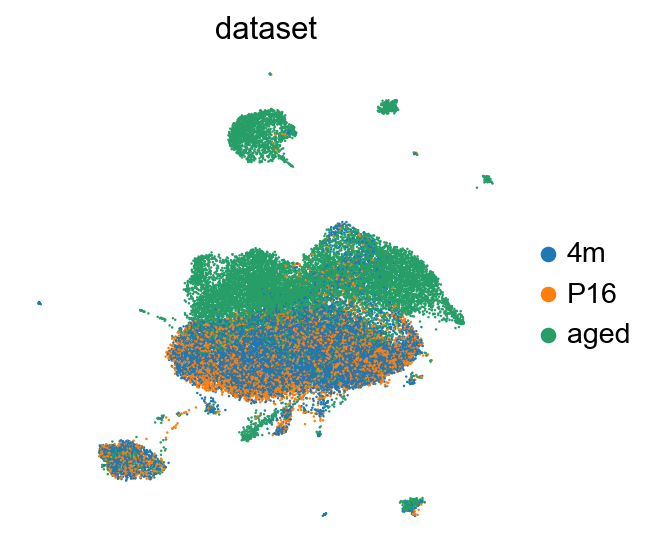

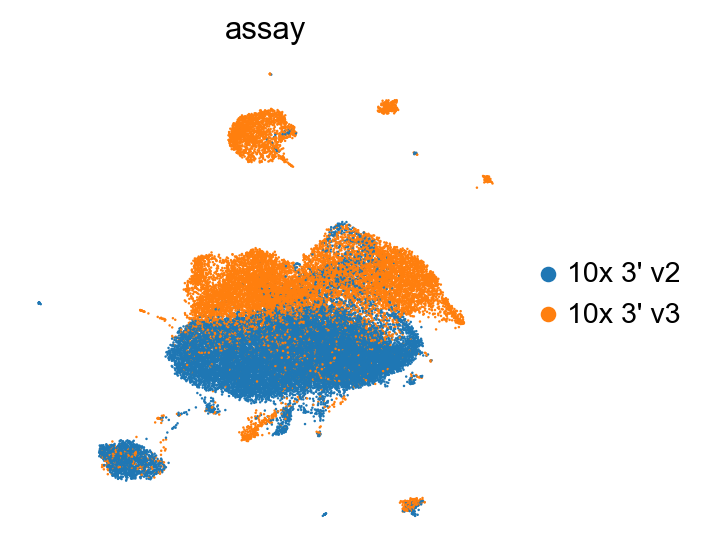

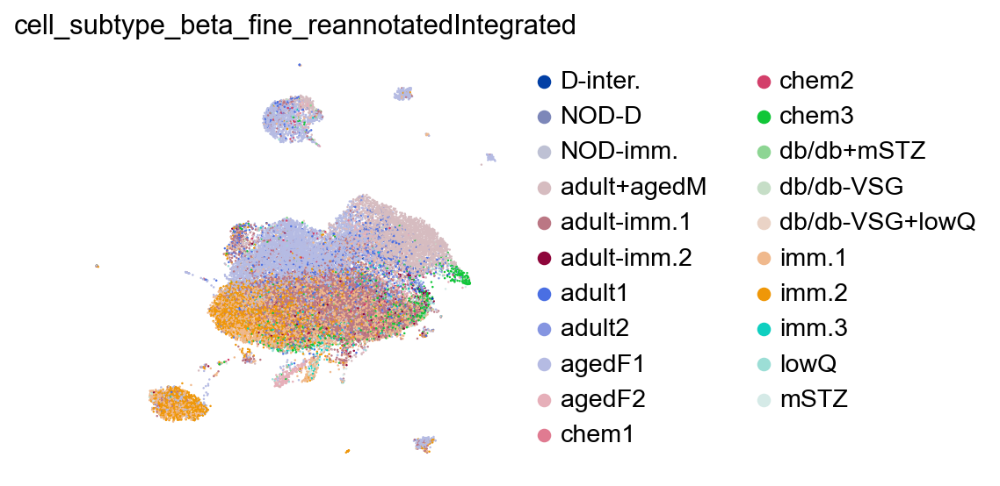

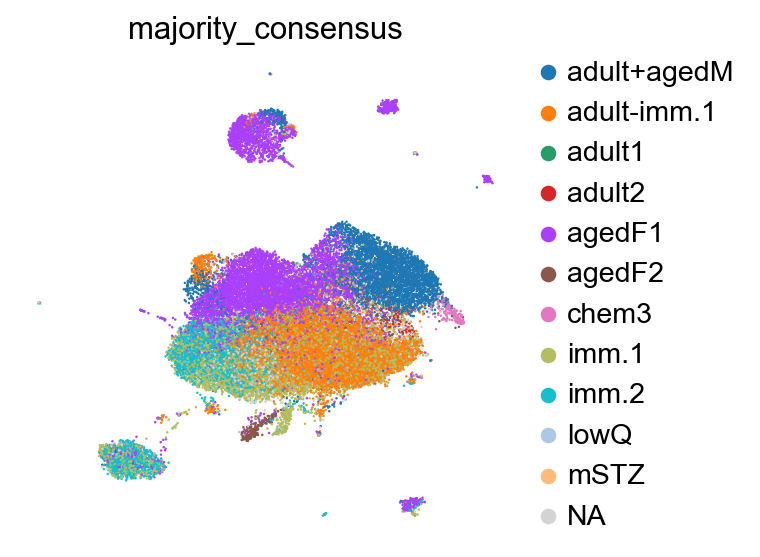

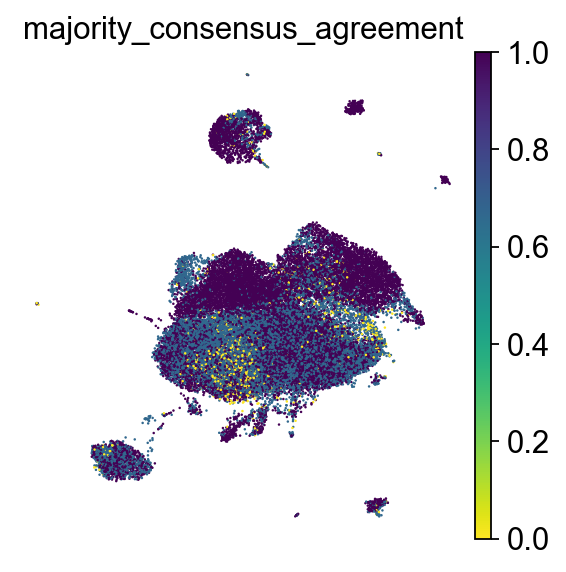

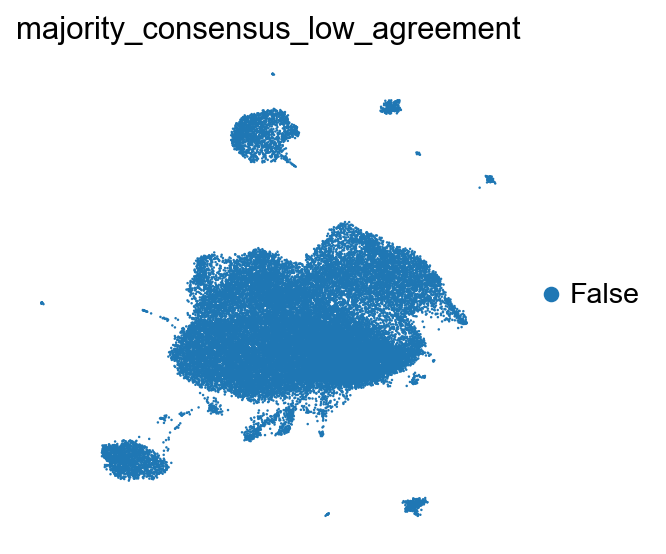

In [14]:
integration = 'harmony'

for col in colors:
    sc.pl.embedding(
        adata,
        f'X_umap--marker_genes:label_transfer:clustering:metrics:{integration}',
        color=col,
        sort_order=False,
        cmap='viridis_r',
        size=5,
    )

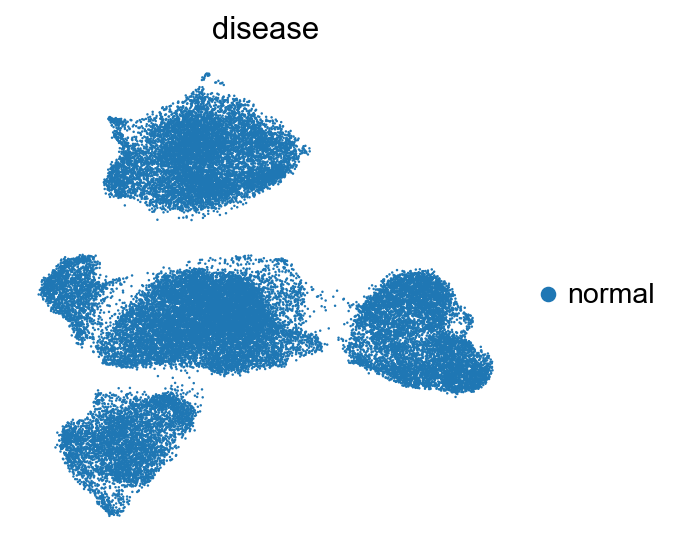

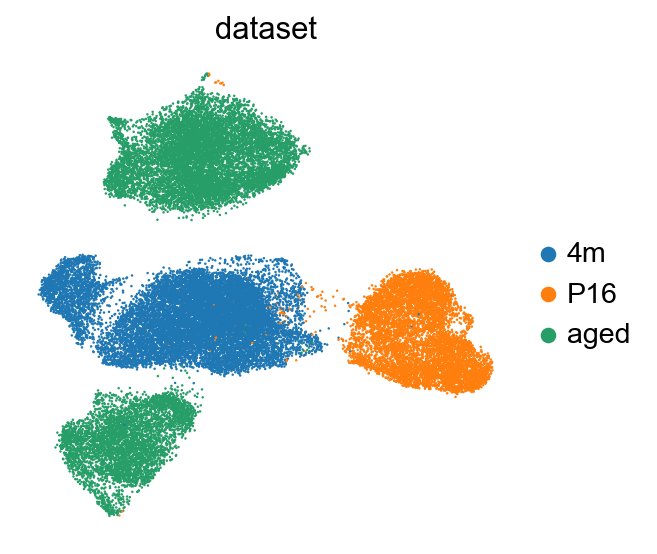

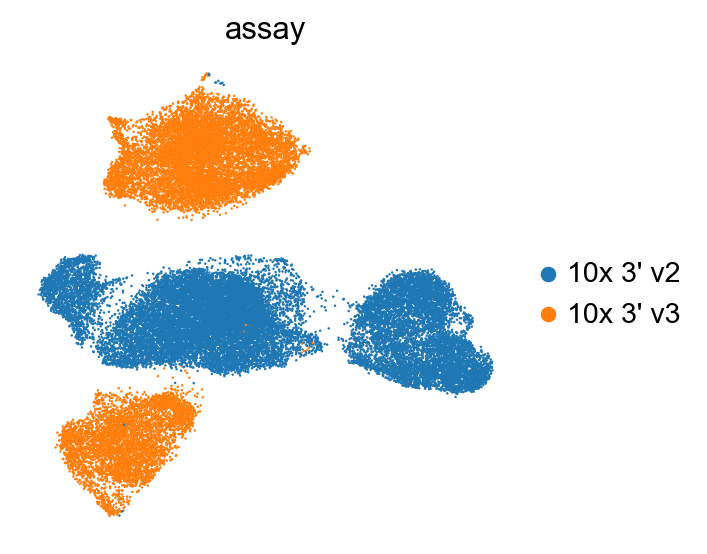

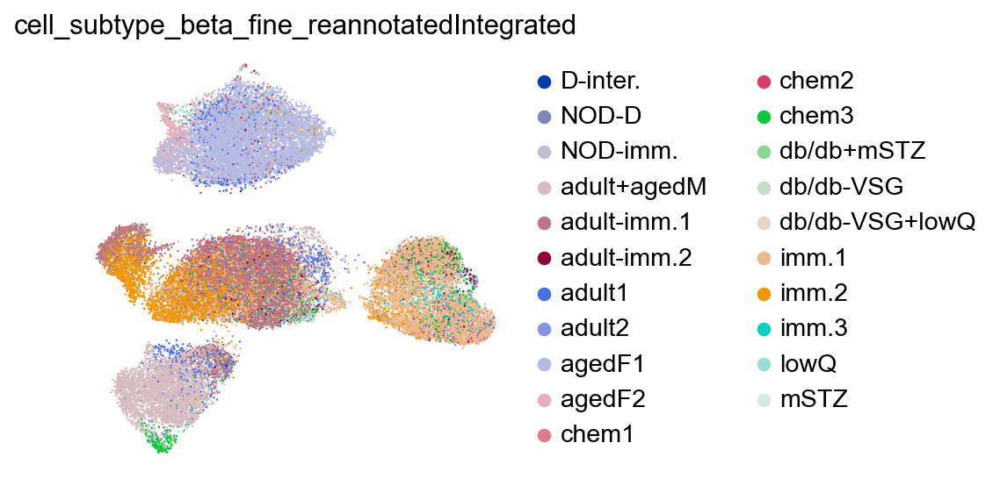

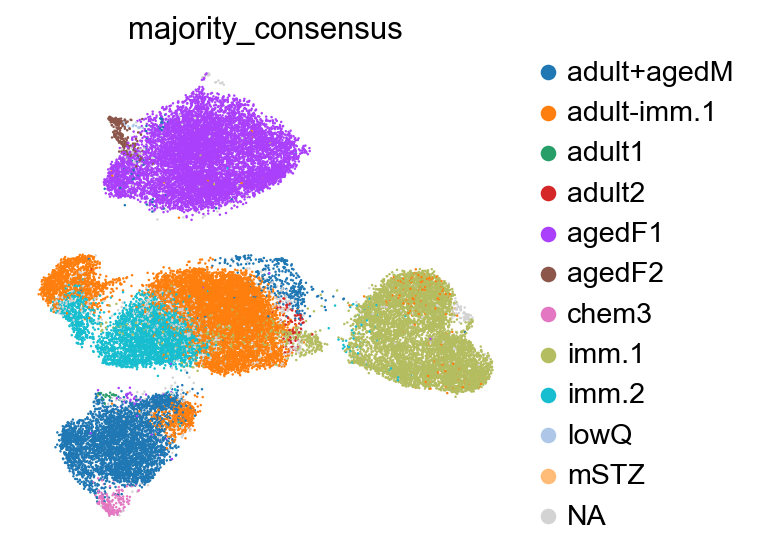

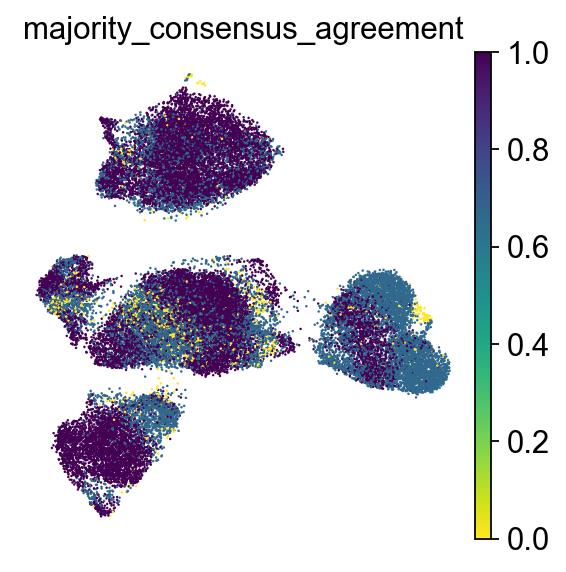

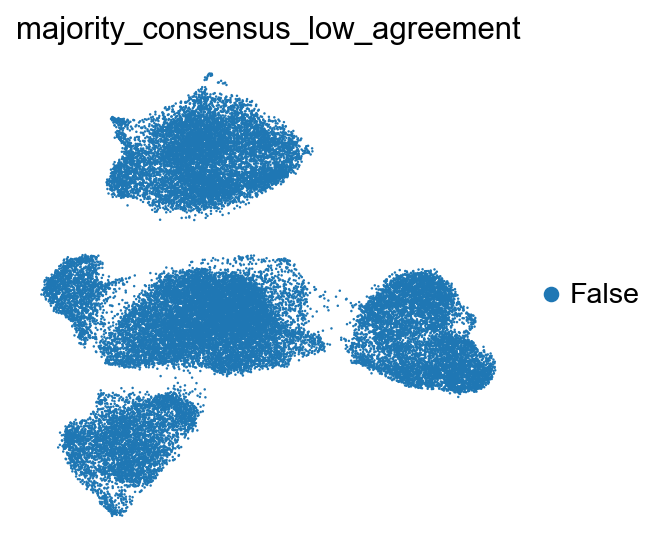

In [15]:
integration = 'unintegrated'

for col in colors:
    sc.pl.embedding(
        adata,
        f'X_umap--marker_genes:label_transfer:clustering:metrics:{integration}',
        color=col,
        sort_order=False,
        cmap='viridis_r',
        size=5,
    )

## Decide on integration approach

Based on integration benchmark scVI performs best.

In [16]:
# select integration to use for downstream
integration = 'marker_genes:label_transfer:clustering:metrics:scvi'

## Majority voting

For each integration, given a reference annotation, we can predict the annotations of unannotated (or even annotated) cells via majority voting which is dependent on the structure of the data.
Here, we have implemented a 2-step procedure to 1. get a majority voting **per** integration and 2. get a majority voting **across** integrations:

1. Cluster-level majority voting (`majority_reference`): high resolution Leiden clustering -> majority voting of reference annotation per cluster
2. Cell-level majority voting (`majority_consensus`): for each cell, take the majority vote of labels from 1. for each integration

As a result, we obtain one `majority_reference` assignment per integration and one `majority_consensus` assignment across all integrations. The `majority_consensus` also gives us an uncertainty measurement based on how many integrations agree on the assigned label.

In [17]:
reference_key = 'cell_subtype_beta_fine_reannotatedIntegrated'

In [18]:
categories = adata.obs[reference_key].cat.categories
for col in adata.obs.columns:
    if col.startswith('majority_reference'):
       adata.obs[col] = adata.obs[col].cat.set_categories(categories)

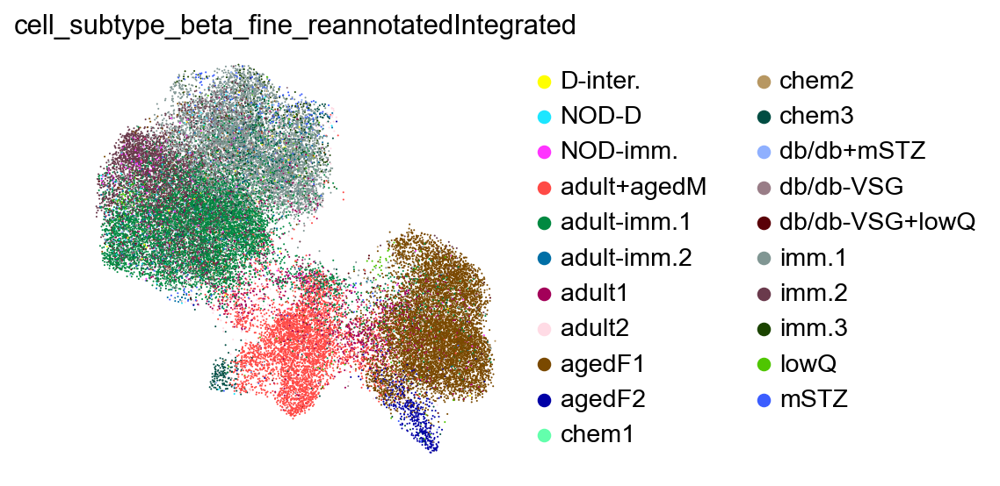

basis=X_umap--marker_genes:label_transfer:clustering:metrics:harmony


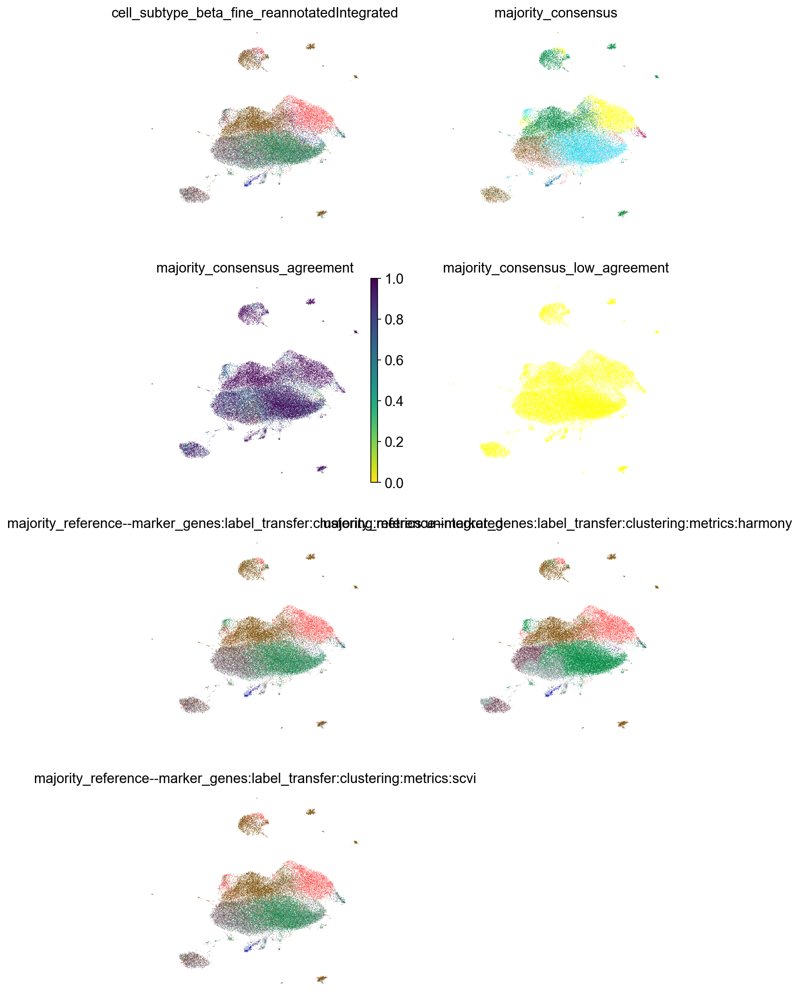

basis=X_umap--marker_genes:label_transfer:clustering:metrics:scvi


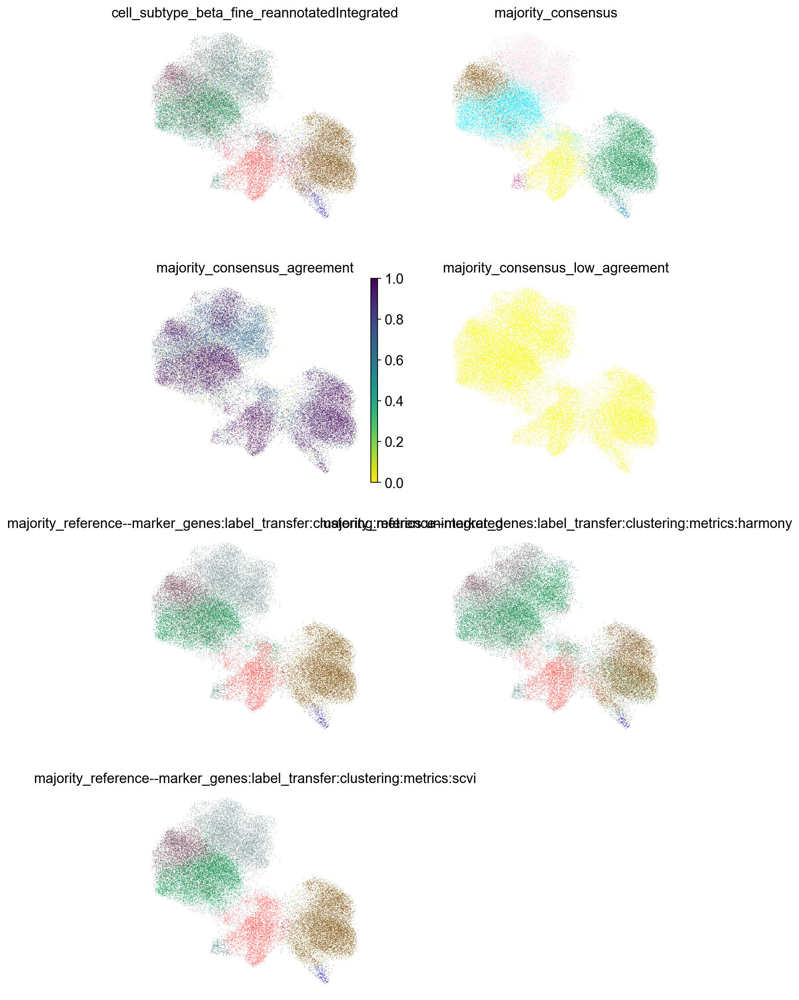

basis=X_umap--marker_genes:label_transfer:clustering:metrics:unintegrated


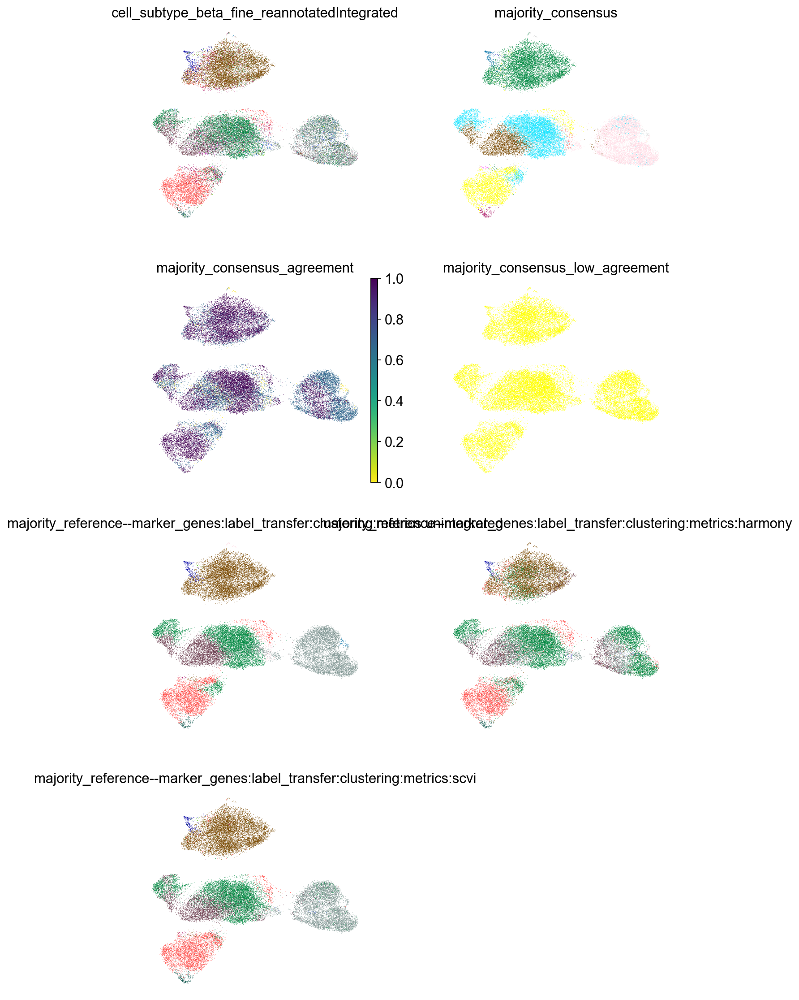

In [19]:
sc.pl.embedding(
    adata,
    basis=f'X_umap--{integration}',
    color='cell_subtype_beta_fine_reannotatedIntegrated',
    palette=sc.pl.palettes.default_102,
)

# for basis in [f'X_umap--{integration}']:
for basis in [x for x in adata.obsm if x.startswith('X_umap--')]:
    print(f'basis={basis}')
    colors = [
        reference_key,
        'majority_consensus',
        'majority_consensus_agreement',
        'majority_consensus_low_agreement'
    ] + [
        x for x in adata.obs.columns if x.startswith('majority_reference--')
    ]
    sc.pl.embedding(
        adata,
        basis=basis,
        color=colors,
        size=1,
        ncols=2,
        legend_loc=None,
        cmap='viridis_r',
        palette=sc.pl.palettes.default_102,
    )

## Analysing clusters

Iterative clustering results are provided for each integration.
For hierarchy/level 1, the complete dataset was clustered with resolution 0.5, while for levels 2, each cluster from level 1 was subclustered with resolution 0.2 and similarly for level 3 with resolution 0.5.

Parameters from pipeline:
```yaml
clustering:
  algorithm: leiden
  use_gpu: false
  neighbors:
    use_rep: X_emb
  resolutions:
    - 0.5
  hierarchy:
    2: 0.2
    3: 0.5
```

Across the hierarchies, the cluster label names match, where the prefix of level 2 clusters correspond to the level 1 cluster it originated from.

In [20]:
adata.obs[
    [f'leiden_0.5_1--{integration}', f'leiden_0.5_2--{integration}']
].drop_duplicates().sort_values(f'leiden_0.5_2--{integration}')

,leiden_0.5_1--marker_genes:label_transfer:clustering:metrics:scvi,leiden_0.5_2--marker_genes:label_transfer:clustering:metrics:scvi
index,,
AGCTCAAAGAGTTGTA-1-MUC13976-Fltp_2y,0,0_0
AAATGGATCCCTCGAT-1-MUC13974-Fltp_2y,1,1_0
GTTTCTAAGACGCACA-1-mouse2-Fltp_adult,1,1_1
CTGCCATGTCGCATTA-1-MUC13974-Fltp_2y,2,2_0
TTAATCCAGTAGTGCG-1-MUC13976-Fltp_2y,2,2_1
ATCCCTGGTCGGCACT-1-MUC13976-Fltp_2y,2,2_2
GGCCGATTCAAAGTAG-1-mouse4-Fltp_adult,3,3_0
GATGAAAAGCTACCTA-1-146_mRFP-Fltp_P16,4,4_0
ATCATGGTCGACCAGC-1-mouse1-Fltp_adult,5,5_0


In the following are examples of clustering level 1 (coarsest clustering level).
Depending on the analysis, you might want to increase the clustering level to level 2. However since level 2 contains many clusters, it will be difficult to visualise on a UMAP.
Increasing to level 2 will make most sense if you want to investigate subclusters.

In [21]:
cluster_key = f'leiden_0.5_1--{integration}'

### Compare clustering results across integrations

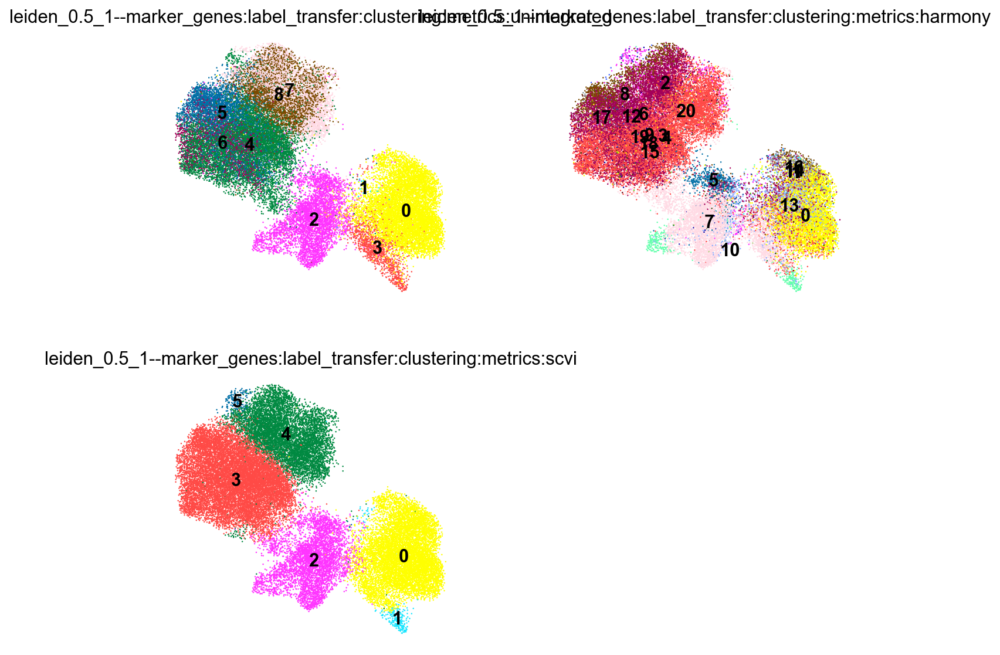

In [22]:
sc.pl.embedding(
    adata,
    f'X_umap--{integration}',
    color=[col for col in adata.obs.columns if col.startswith('leiden_0.5_1')],
    legend_loc='on data',
    ncols=2,
    size=5,
    palette=sc.pl.palettes.default_102,
)

### Compare annotations against clusters

In [23]:
def nmi(df, x, y):
    """
    NMI score comparing 2 label sets
    removes all NaN values before computing score
    """
    from sklearn.metrics.cluster import normalized_mutual_info_score

    df = df[[x, y]]
    df = df[df[x].notna() & df[y].notna()]
    return normalized_mutual_info_score(df[x], df[y])

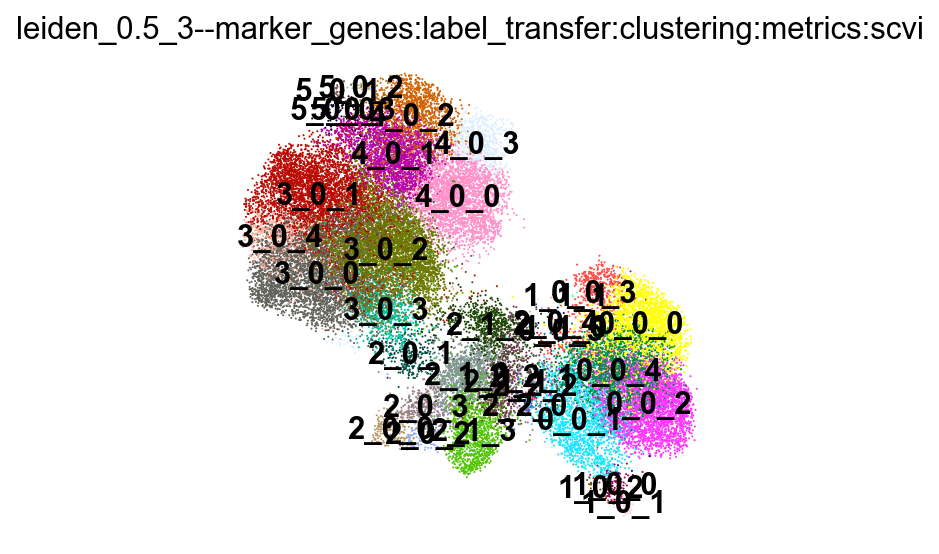

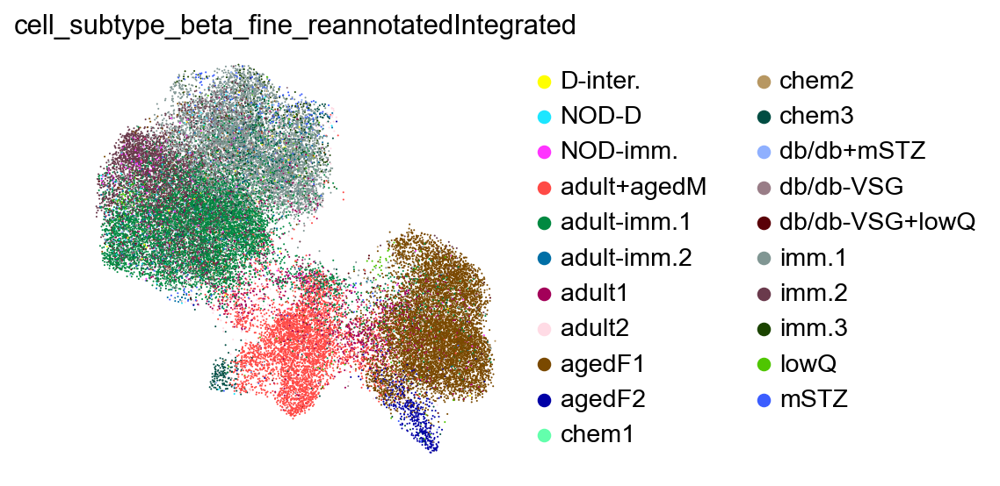

In [26]:
sc.pl.embedding(
    adata,
    f'X_umap--{integration}',
    color=f'leiden_0.5_3--{integration}',
    legend_loc='on data',
)

sc.pl.embedding(
    adata,
    f'X_umap--{integration}',
    color=reference_key,
)